**CodeAlpha Task 3**

**Predictive Modeling with Linear Regression( House Price Prediction ) by ABU BAKAR SIDDIQ**

**Predictive Modeling with
Linear Regression
Build a predictive model using linear regression to
predict a numerical outcome based on one or more
features. Use a dataset with a continuous target
variable.**

**Importing necessary Libraries**

In [11]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.pipeline import Pipeline
from sklearn.linear_model import Ridge
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score

**Discovering, Loading, Processing, Cleaning & Transforming the DataSet**

In [12]:
def load_and_preprocess_data(file_path):
    df = pd.read_csv(file_path)
    
    print("Columns in dataset:", df.columns.tolist())
    
    features = ['squareMeters', 'numberOfRooms', 'hasYard', 'hasPool', 'isNewBuilt', 
                'hasStormProtector', 'basement', 'attic', 'garage', 'made']
    target = 'price'
    
    df = df.dropna(subset=[target])
    
    missing_features = [feature for feature in features if feature not in df.columns]
    if missing_features:
        raise KeyError(f"Columns missing from dataset: {', '.join(missing_features)}")
    
    df['houseAge'] = 2024 - df['made']
    df['squareMetersXrooms'] = df['squareMeters'] * df['numberOfRooms']
    
    X = df[['squareMeters', 'numberOfRooms', 'hasYard', 'hasPool', 'isNewBuilt', 
             'hasStormProtector', 'basement', 'attic', 'garage', 'houseAge', 'squareMetersXrooms']]
    y = df[target]
    
    numerical_features = ['squareMeters', 'numberOfRooms', 'houseAge', 'squareMetersXrooms', 
                          'basement', 'attic', 'garage']
    categorical_features = ['hasYard', 'hasPool', 'isNewBuilt', 'hasStormProtector']
    
    num_transformer = Pipeline(steps=[
        ('scaler', StandardScaler())  
    ])
    
    cat_transformer = OneHotEncoder(handle_unknown='ignore')  
    
    preprocessor = ColumnTransformer(
        transformers=[
            ('num', num_transformer, numerical_features),
            ('cat', cat_transformer, categorical_features)
        ]
    )
    
    return df, X, y, preprocessor

**Doing Exploratory Data Analysis (EDA) & Data Visualization**

In [13]:
def perform_eda(df):
    numerical_cols = df.select_dtypes(include=['float64', 'int64']).columns
    df_numerical = df[numerical_cols]
    
    plt.figure(figsize=(14, 7))
    sns.heatmap(df_numerical.corr(), annot=True, cmap='coolwarm', fmt='.2f')
    plt.title('Correlation Heatmap')
    plt.show()

    plt.figure(figsize=(14, 7))
    sns.pairplot(df_numerical)
    plt.show()

**Building & Training model by HyperParameter Tuning**

In [14]:
def build_and_train_model(X, y, preprocessor):
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=0)
    
    model = Pipeline(steps=[
        ('preprocessor', preprocessor),
        ('regressor', Ridge())  
    ])
    
    param_grid = {
        'regressor__alpha': [0.1, 1.0, 10.0, 100.0]
    }
    
    grid_search = GridSearchCV(model, param_grid, cv=5, scoring='r2')
    grid_search.fit(X_train, y_train)
    
    best_model = grid_search.best_estimator_
    return best_model, X_train, X_test, y_train, y_test

**Evaluating the Model & doing Visualization of it**

In [15]:
def evaluate_model(model, X_test, y_test):
    y_pred = model.predict(X_test)
    
    mse = mean_squared_error(y_test, y_pred)
    mae = mean_absolute_error(y_test, y_pred)
    r2 = r2_score(y_test, y_pred)
    
    print(f"Mean Squared Error: {mse:.2f}")
    print(f"Mean Absolute Error: {mae:.2f}")
    print(f"R² Score: {r2:.2f}")

    # Plot actual vs predicted prices with different colors
    plt.figure(figsize=(10, 6))
    plt.scatter(y_test, y_pred, alpha=0.7, color='blue', label='Predicted Prices')
    plt.plot([min(y_test), max(y_test)], [min(y_test), max(y_test)], 'r--', lw=2, label='Perfect Prediction')
    plt.xlabel('Actual Prices')
    plt.ylabel('Predicted Prices')
    plt.title('Actual vs Predicted Prices')
    plt.legend()
    plt.grid(True)
    plt.show()

    # Residual plot
    residuals = y_test - y_pred
    plt.figure(figsize=(10, 6))
    plt.scatter(y_pred, residuals, color='purple', alpha=0.5)
    plt.axhline(y=0, color='red', linestyle='--')
    plt.xlabel('Predicted Prices')
    plt.ylabel('Residuals')
    plt.title('Residuals vs Predicted Prices')
    plt.grid(True)
    plt.show()

    # Histogram of residuals
    plt.figure(figsize=(10, 6))
    sns.histplot(residuals, bins=30, kde=True, color='orange')
    plt.axvline(x=0, color='red', linestyle='--')
    plt.title('Distribution of Residuals')
    plt.xlabel('Residuals')
    plt.ylabel('Frequency')
    plt.grid(True)
    plt.show()

**Model Recommendations Based on User's Requirements about House-Price**

Columns in dataset: ['squareMeters', 'numberOfRooms', 'hasYard', 'hasPool', 'floors', 'cityCode', 'cityPartRange', 'numPrevOwners', 'made', 'isNewBuilt', 'hasStormProtector', 'basement', 'attic', 'garage', 'hasStorageRoom', 'hasGuestRoom', 'price']


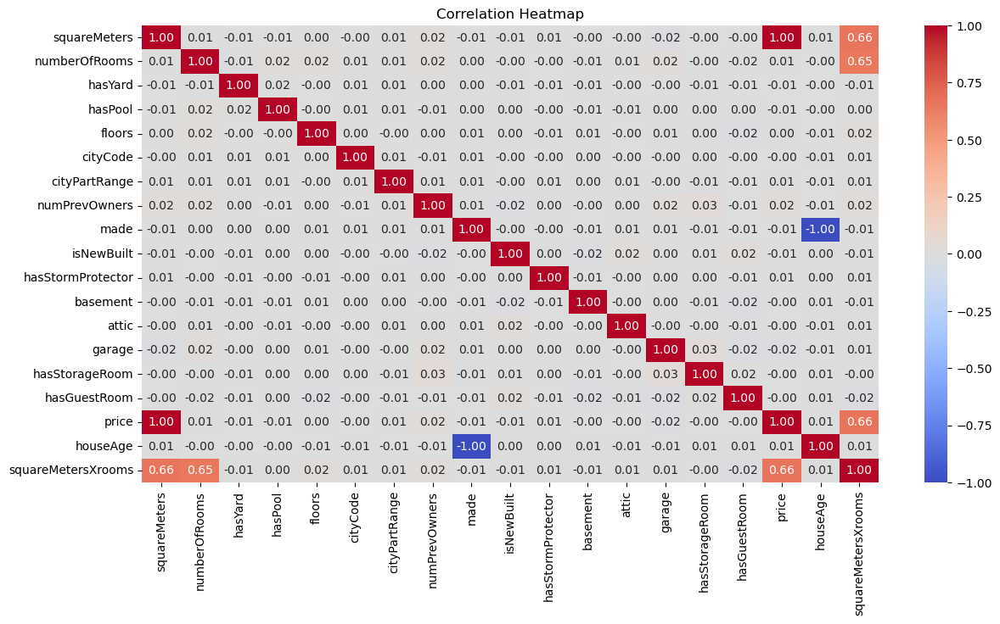

<Figure size 1400x700 with 0 Axes>

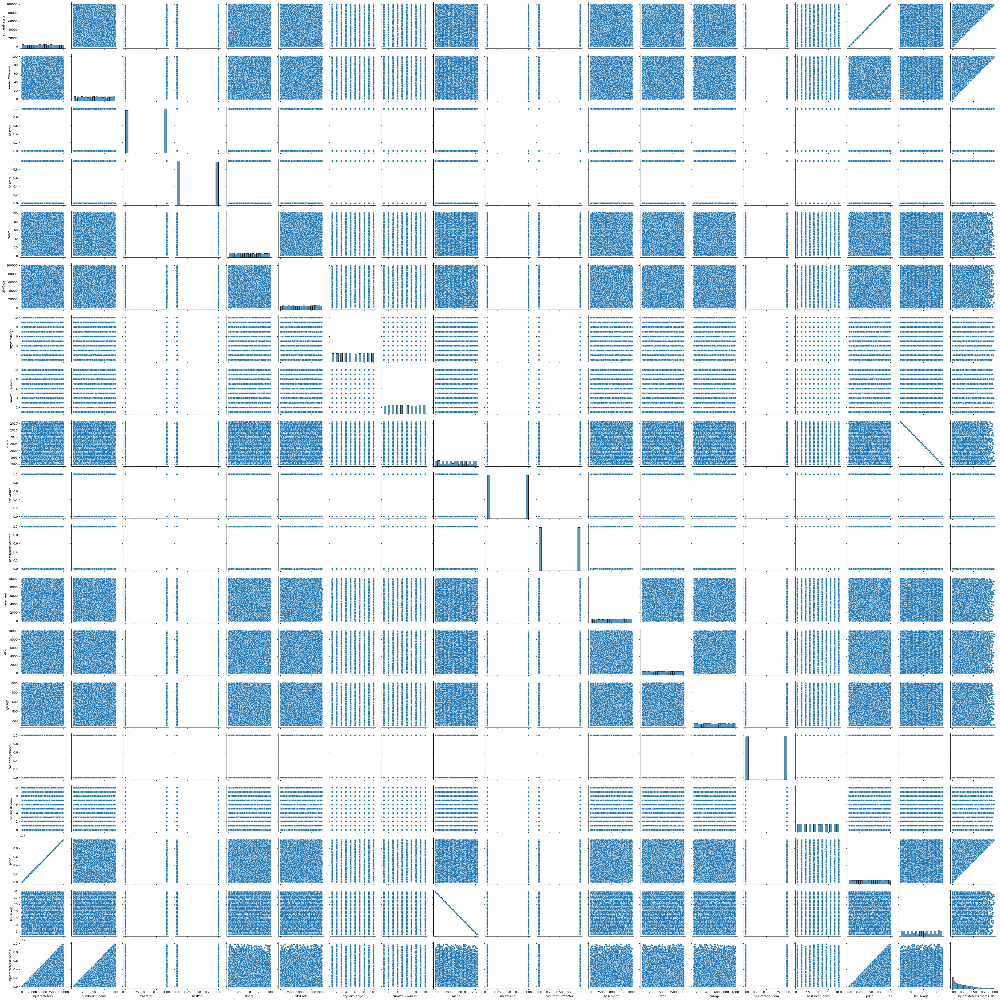

Mean Squared Error: 6057145.52
Mean Absolute Error: 1970.59
R² Score: 1.00


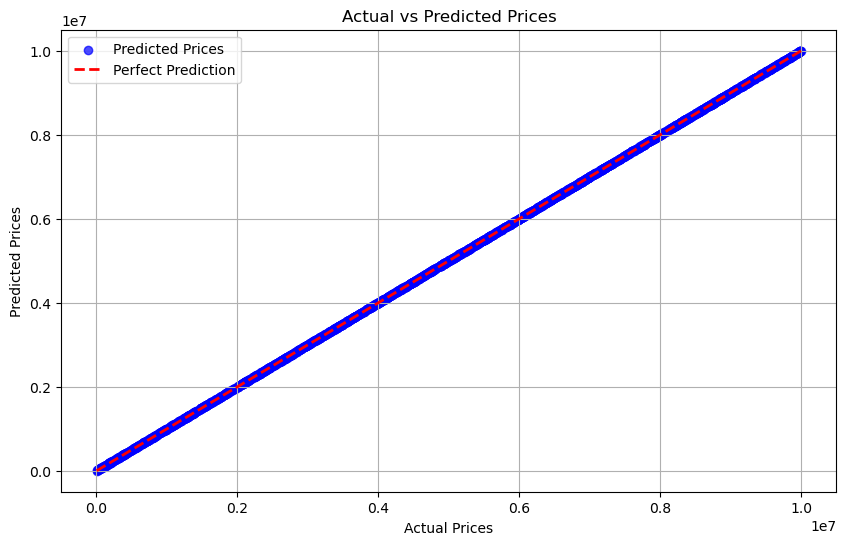

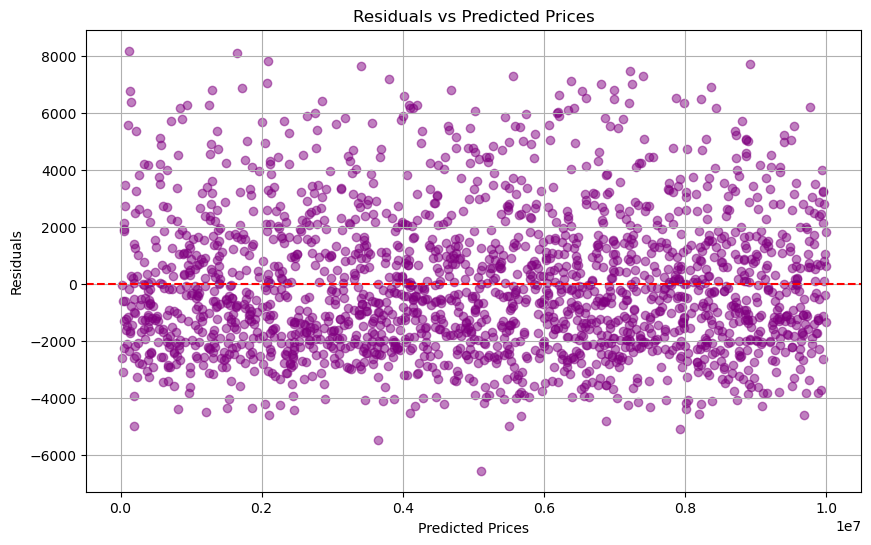

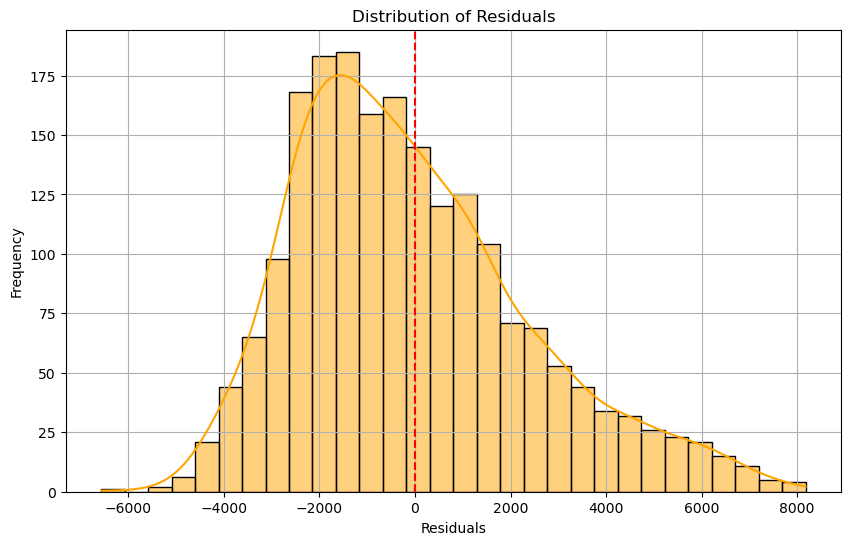

squareMeters:  5000
numberOfRooms:  6
hasYard (0 for No, 1 for Yes):  1
hasPool (0 for No, 1 for Yes):  1
isNewBuilt (0 for No, 1 for Yes):  1
hasStormProtector (0 for No, 1 for Yes):  1
basement (0 for No, 1 for Yes):  1
attic (0 for No, 1 for Yes):  1
garage (0 for No, 1 for Yes):  1


Predicted Price for your house: $507,372.77


In [16]:
def user_interaction_and_recommendations(model):
    user_input = {
        'squareMeters': float(input("squareMeters: ")),
        'numberOfRooms': int(input("numberOfRooms: ")),
        'hasYard': int(input("hasYard (0 for No, 1 for Yes): ")),
        'hasPool': int(input("hasPool (0 for No, 1 for Yes): ")),
        'isNewBuilt': int(input("isNewBuilt (0 for No, 1 for Yes): ")),
        'hasStormProtector': int(input("hasStormProtector (0 for No, 1 for Yes): ")),
        'basement': int(input("basement (0 for No, 1 for Yes): ")),
        'attic': int(input("attic (0 for No, 1 for Yes): ")),
        'garage': int(input("garage (0 for No, 1 for Yes): "))
    }
    
    user_df = pd.DataFrame([user_input])
    user_df['houseAge'] = 2024 - user_input['squareMeters']
    user_df['squareMetersXrooms'] = user_df['squareMeters'] * user_df['numberOfRooms']
    
    # Ensure the model's preprocessor is used to transform the user input
    user_df_transformed = model.named_steps['preprocessor'].transform(user_df)
    predicted_price = model.named_steps['regressor'].predict(user_df_transformed)[0]
    
    print(f"Predicted Price for your house: ${predicted_price:,.2f}")

# File path to dataset
file_path = 'ParisHousing.csv'

# Execute the steps
df, X, y, preprocessor = load_and_preprocess_data(file_path)
perform_eda(df)
model, X_train, X_test, y_train, y_test = build_and_train_model(X, y, preprocessor)
evaluate_model(model, X_test, y_test)
user_interaction_and_recommendations(model)